In [1]:
import glob
import numpy as np
import pandas as pd
from tqdm import tqdm_notebook
from sklearn.preprocessing import MultiLabelBinarizer

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
# Para o Modelo
import tensorflow as tf
import keras
from keras import backend as K
from keras.applications.vgg16 import VGG16
from keras.applications.vgg19 import VGG19
from keras.optimizers import *
from keras.callbacks import *
from keras.metrics import top_k_categorical_accuracy
from keras.utils import to_categorical, Sequence
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split

/home/andre/.conda/envs/py36/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [2]:
pd.options.display.float_format = '{:,.4f}%'.format
pd.set_option('display.max_rows', 700)

In [3]:
files =  glob.glob("../dados_*/*.dat")

In [4]:
len(files)

1320

In [5]:
arquivos_processados = []
for arquivo in files:
    arquivo = arquivo.replace(".dat", "")
    arquivos_processados.extend([arquivo.split("/")[-1].split('_')])

In [6]:
df_arquivos_processados = pd.DataFrame(arquivos_processados)
df_arquivos_processados.columns = ['nuclei', 'distance', 'estories', 'multichannel_start']

In [7]:
df_arquivos_processados.groupby(['nuclei', 'distance','estories', 'multichannel_start']).count()

Empty DataFrame
Columns: []
Index: [(Am-241, 41cm, 1-0e07estories, 0), (Am-241, 41cm, 1-0e07estories, 1), (Am-241, 41cm, 1-0e07estories, 150), (Am-241, 41cm, 1-0e07estories, 250), (Am-241, 41cm, 1-0e07estories, 300), (Am-241, 41cm, 1-0e07estories, 400), (Am-241, 41cm, 1-0e08estories, 0), (Am-241, 41cm, 1-0e08estories, 1), (Am-241, 41cm, 1-0e08estories, 150), (Am-241, 41cm, 1-0e08estories, 250), (Am-241, 41cm, 1-0e08estories, 300), (Am-241, 41cm, 1-0e08estories, 400), (Am-241, 41cm, 1-0e09estories, 0), (Am-241, 41cm, 1-0e09estories, 1), (Am-241, 41cm, 1-0e09estories, 150), (Am-241, 41cm, 1-0e09estories, 250), (Am-241, 41cm, 1-0e09estories, 300), (Am-241, 41cm, 1-0e09estories, 400), (Am-241, 46cm, 1-0e07estories, 0), (Am-241, 46cm, 1-0e07estories, 1), (Am-241, 46cm, 1-0e07estories, 150), (Am-241, 46cm, 1-0e07estories, 250), (Am-241, 46cm, 1-0e07estories, 300), (Am-241, 46cm, 1-0e07estories, 400), (Am-241, 46cm, 1-0e08estories, 0), (Am-241, 46cm, 1-0e08estories, 1), (Am-241, 46cm, 1-0e08estories, 150), (Am-241, 46cm, 1-0e08estories, 250), (Am-241, 46cm, 1-0e08estories, 300), (Am-241, 46cm, 1-0e08estories, 400), (Am-241, 46cm, 1-0e09estories, 0), (Am-241, 46cm, 1-0e09estories, 1), (Am-241, 46cm, 1-0e09estories, 150), (Am-241, 46cm, 1-0e09estories, 250), (Am-241, 46cm, 1-0e09estories, 300), (Am-241, 46cm, 1-0e09estories, 400), (Am-241, 51cm, 1-0e07estories, 0), (Am-241, 51cm, 1-0e07estories, 1), (Am-241, 51cm, 1-0e07estories, 150), (Am-241, 51cm, 1-0e07estories, 250), (Am-241, 51cm, 1-0e07estories, 300), (Am-241, 51cm, 1-0e07estories, 400), (Am-241, 51cm, 1-0e08estories, 0), (Am-241, 51cm, 1-0e08estories, 1), (Am-241, 51cm, 1-0e08estories, 150), (Am-241, 51cm, 1-0e08estories, 250), (Am-241, 51cm, 1-0e08estories, 300), (Am-241, 51cm, 1-0e08estories, 400), (Am-241, 51cm, 1-0e09estories, 0), (Am-241, 51cm, 1-0e09estories, 1), (Am-241, 51cm, 1-0e09estories, 150), (Am-241, 51cm, 1-0e09estories, 250), (Am-241, 51cm, 1-0e09estories, 300), (Am-241, 51cm, 1-0e09estories, 400), (Am-241, 56cm, 1-0e07estories, 0), (Am-241, 56cm, 1-0e07estories, 1), (Am-241, 56cm, 1-0e07estories, 150), (Am-241, 56cm, 1-0e07estories, 250), (Am-241, 56cm, 1-0e07estories, 300), (Am-241, 56cm, 1-0e07estories, 400), (Am-241, 56cm, 1-0e08estories, 0), (Am-241, 56cm, 1-0e08estories, 1), (Am-241, 56cm, 1-0e08estories, 150), (Am-241, 56cm, 1-0e08estories, 250), (Am-241, 56cm, 1-0e08estories, 300), (Am-241, 56cm, 1-0e08estories, 400), (Am-241, 56cm, 1-0e09estories, 0), (Am-241, 56cm, 1-0e09estories, 1), (Am-241, 56cm, 1-0e09estories, 150), (Am-241, 56cm, 1-0e09estories, 250), (Am-241, 56cm, 1-0e09estories, 300), (Am-241, 56cm, 1-0e09estories, 400), (Ba-133, 41cm, 1-0e07estories, 0), (Ba-133, 41cm, 1-0e07estories, 1), (Ba-133, 41cm, 1-0e07estories, 150), (Ba-133, 41cm, 1-0e07estories, 250), (Ba-133, 41cm, 1-0e07estories, 300), (Ba-133, 41cm, 1-0e07estories, 400), (Ba-133, 41cm, 1-0e08estories, 0), (Ba-133, 41cm, 1-0e08estories, 1), (Ba-133, 41cm, 1-0e08estories, 150), (Ba-133, 41cm, 1-0e08estories, 250), (Ba-133, 41cm, 1-0e08estories, 300), (Ba-133, 41cm, 1-0e08estories, 400), (Ba-133, 41cm, 1-0e09estories, 0), (Ba-133, 41cm, 1-0e09estories, 1), (Ba-133, 41cm, 1-0e09estories, 150), (Ba-133, 41cm, 1-0e09estories, 250), (Ba-133, 41cm, 1-0e09estories, 300), (Ba-133, 41cm, 1-0e09estories, 400), (Ba-133, 46cm, 1-0e07estories, 0), (Ba-133, 46cm, 1-0e07estories, 1), (Ba-133, 46cm, 1-0e07estories, 150), (Ba-133, 46cm, 1-0e07estories, 250), (Ba-133, 46cm, 1-0e07estories, 300), (Ba-133, 46cm, 1-0e07estories, 400), (Ba-133, 46cm, 1-0e08estories, 0), (Ba-133, 46cm, 1-0e08estories, 1), (Ba-133, 46cm, 1-0e08estories, 150), (Ba-133, 46cm, 1-0e08estories, 250), ...]

[720 rows x 0 columns]

In [8]:
df_arquivos_processados.groupby(['nuclei', 'distance', 'estories']).count()

multichannel_start
nuclei distance estories                          
Am-241 41cm     1-0e07estories                  11
                1-0e08estories                  11
                1-0e09estories                  11
       46cm     1-0e07estories                  11
                1-0e08estories                  11
                1-0e09estories                  11
       51cm     1-0e07estories                  11
                1-0e08estories                  11
                1-0e09estories                  11
       56cm     1-0e07estories                  11
                1-0e08estories                  11
                1-0e09estories                  11
Ba-133 41cm     1-0e07estories                  11
                1-0e08estories                  11
                1-0e09estories                  11
       46cm     1-0e07estories                  11
                1-0e08estories                  11
                1-0e09estories                  11
       51cm     1-0e07estories                  11
                1-0e08estories                  11
                1-0e09estories                  11
       56cm     1-0e07estories                  11
                1-0e08estories                  11
                1-0e09estories                  11
Cd-109 41cm     1-0e07estories                  11
                1-0e08estories                  11
                1-0e09estories                  11
       46cm     1-0e07estories                  11
                1-0e08estories                  11
                1-0e09estories                  11
       51cm     1-0e07estories                  11
                1-0e08estories                  11
                1-0e09estories                  11
       56cm     1-0e07estories                  11
                1-0e08estories                  11
                1-0e09estories                  11
Co-57  41cm     1-0e07estories                  11
                1-0e08estories                  11
                1-0e09estories                  11
       46cm     1-0e07estories                  11
                1-0e08estories                  11
                1-0e09estories                  11
       51cm     1-0e07estories                  11
                1-0e08estories                  11
                1-0e09estories                  11
       56cm     1-0e07estories                  11
                1-0e08estories                  11
                1-0e09estories                  11
Co-60  41cm     1-0e07estories                  11
                1-0e08estories                  11
                1-0e09estories                  11
       46cm     1-0e07estories                  11
                1-0e08estories                  11
                1-0e09estories                  11
       51cm     1-0e07estories                  11
                1-0e08estories                  11
                1-0e09estories                  11
       56cm     1-0e07estories                  11
                1-0e08estories                  11
                1-0e09estories                  11
Cs-137 41cm     1-0e07estories                  11
                1-0e08estories                  11
                1-0e09estories                  11
       46cm     1-0e07estories                  11
                1-0e08estories                  11
                1-0e09estories                  11
       51cm     1-0e07estories                  11
                1-0e08estories                  11
                1-0e09estories                  11
       56cm     1-0e07estories                  11
                1-0e08estories                  11
                1-0e09estories                  11
Eu-152 41cm     1-0e07estories                  11
                1-0e08estories                  11
                1-0e09estories                  11
       46cm     1-0e07estories                  11
                1-0e08estories                  11
   

In [9]:
def carrega_dados(filename, n_particulas=1.0e07):
    data = {
        'Elow(eV)' : [],
        'Emiddle(eV)' : [],
        'counts(1/eV/hist)' : [],
        '+-2sigma':[],
        'nbin' : []
    }

    linha_de_dados = False
    with open(filename, "r") as f:
        for line in f:
            if line[0] == '#':
                linha_de_dados = False
            else:
                linha_de_dados = True

            if linha_de_dados:
                aux = line.split(' ')
                if len(aux) == 2:
                    break

                data['Elow(eV)'].append(np.fromstring(aux[2], dtype=np.float64, sep=',')[0])
                data['Emiddle(eV)'].append(np.fromstring(aux[4], dtype=np.float64, sep=',')[0])
                q = np.fromstring(aux[6], dtype=np.float64, sep=',')[0]
                data['counts(1/eV/hist)'].append(q)
                data['+-2sigma'].append(np.fromstring(aux[8], dtype=np.float64, sep=',')[0])
                nbin = np.fromstring(aux[9], dtype=np.int, sep=',')[0]
                data['nbin'].append(nbin)      

    df = pd.DataFrame.from_dict(data)
    df['counts'] = df['counts(1/eV/hist)'].values * n_particulas * 1 / ((df['Elow(eV)'].shift(-1).fillna(0) - df['Elow(eV)']) / df['nbin'])
    #df['counts'] = df['counts'].astype(np.uint8)
    df['counts'][0:20] = 0
    df['E'] = df['Elow(eV)'] / 1e3
    return df.loc[0:16383]

def gera_imagem_combinada(dicionario_imagens, n_combinacoes=3):
    assert n_combinacoes <= 10, "No máximo 10 combinações"

    aux = np.random.choice(dicionario_imagens, n_combinacoes, replace=False)
    #print(aux)
    labels = np.sum([x['y'] for x in aux], axis=0)
    values = np.sum([x['X'] for x in aux], axis=0)
    
    while np.max(labels) > 1: # temos nuclideo repetido
        labels[0][np.argmax(labels[0])] = 1
    
    return values, labels

# Gera massa de dados

## Treino

In [12]:
energias_iniciais_multicanal = ['1', '250', '400', '150', '300', '0']
#energias_iniciais_multicanal = ['0-01.dat']

In [10]:
nomes_nuclideos = {
    'Am-241': 0,
    'Ba-133': 1,
    'Cd-109': 2,
    'Co-57': 3,
    'Co-60': 4,
    'Cs-137': 5,
    'Eu-152': 6,
    'Mn-54': 7,
    'Na-22': 8,
    'Pb-210': 9
}

binarizer = MultiLabelBinarizer()
binarizer.fit([list(nomes_nuclideos.keys())])
binarizer.classes_

array(['Am-241', 'Ba-133', 'Cd-109', 'Co-57', 'Co-60', 'Cs-137', 'Eu-152',
       'Mn-54', 'Na-22', 'Pb-210'], dtype=object)

In [13]:
# Cd-109_41cm_1-0e08estories_0-01.dat
dados_por_energia_inicial_multicanal = dict()

contagens_por_nuclideos = {
    'Am-241': [],
    'Ba-133': [],
    'Cd-109': [],
    'Co-57': [],
    'Co-60': [],
    'Cs-137': [],
    'Eu-152': [],
    'Mn-54': [],
    'Na-22': [],
    'Pb-210': []
}

for energia_inicial_multicanal in energias_iniciais_multicanal:
    dados_por_energia_inicial_multicanal[energia_inicial_multicanal] = []
    
    for file_ in tqdm_notebook(files):
        if not file_.endswith(energia_inicial_multicanal+'.dat'):
            continue
        
        partes = file_.split("/")[2].replace(".dat", "").split("_")
        nuclideo = partes[0]        
        distancia = partes[1]
        n_particulas = float(partes[2].replace('estories','').replace('-','.'))
        dados_ = carrega_dados(file_, n_particulas)
        
        contagens_por_nuclideos[nuclideo].append(np.sum(dados_.counts.values))
        
        dados_por_energia_inicial_multicanal[energia_inicial_multicanal].append({'X' : dados_.counts.values,
                                                                                 'n' : n_particulas,
                                                                                 'y': binarizer.transform([[nuclideo]]),
                                                                                 'd': distancia,
                                                                                 'e': energia_inicial_multicanal})

/home/andre/.conda/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [15]:
distancias = list(np.unique([x['d'] for x in dados_por_energia_inicial_multicanal[energias_iniciais_multicanal[0]]]))
n_particulas = list(np.unique([x['n'] for x in dados_por_energia_inicial_multicanal[energias_iniciais_multicanal[0]]]))

distancias, n_particulas

(['41cm', '46cm', '51cm', '56cm'], [10000000.0, 100000000.0, 1000000000.0])

### Gera espectros com mais de um radionuclideo

In [16]:
d_test = '56cm'
n_combinacoes = [2, 3, 4]
novos_dados = dict()

# agrupa a leitura por energia inicial do multicanal e distancia, assim 
for key in energias_iniciais_multicanal:
    novos_dados[key] = []
    for distancia in [x for x in distancias if x != d_test]:
        for n_particula in n_particulas:
            aux_data = [x for x in dados_por_energia_inicial_multicanal[key]
                        if x['d'] == distancia and x['n'] == n_particula]
            
            for n_ in n_combinacoes:
                for i in range(25):
                    values, labels = gera_imagem_combinada(aux_data, n_)
                    novos_dados[key].append({'X' : values, 'y': labels})

In [17]:
X = []
y = []

In [18]:
for key in energias_iniciais_multicanal:
    for item in [x for x in dados_por_energia_inicial_multicanal[key] if x['d'] != d_test]:
        X.append(list(item.values())[0].reshape((128, 128)))
        y.append(item['y'][0])

In [19]:
len(X), len(y)

(1710, 1710)

In [20]:
for key in energias_iniciais_multicanal:
    for item in novos_dados[key]:
        X.append(list(item.values())[0].reshape((128, 128)))
        y.append(item['y'][0])

In [21]:
len(X), len(y)

(5760, 5760)

In [22]:
len([novos_dados[x] for x in novos_dados][0]) + len([novos_dados[x] for x in novos_dados][1]) + len([novos_dados[x] for x in novos_dados][2])+ len([novos_dados[x] for x in novos_dados][3]) + len([novos_dados[x] for x in novos_dados][4])

3375

## Validação

In [23]:
X_test = []
y_test = []

In [24]:
n_combinacoes = [2, 3, 4]
novos_dados_test = dict()

# agrupa a leitura por energia inicial do multicanal e distancia, assim 
for key in energias_iniciais_multicanal:
    novos_dados_test[key] = []
    for distancia in [x for x in distancias if x == d_test]:
        for n_particula in n_particulas:
            aux_data = [x for x in dados_por_energia_inicial_multicanal[key]
                        if x['d'] == distancia and x['n'] == n_particula]
            
            for n_ in n_combinacoes:
                for i in range(5):
                    values, labels = gera_imagem_combinada(aux_data, n_)
                    novos_dados_test[key].append({'X' : values, 'y': labels})

In [25]:
for key in energias_iniciais_multicanal:
    for item in [x for x in dados_por_energia_inicial_multicanal[key] if x['d'] == d_test]:
        X_test.append(list(item.values())[0].reshape((128, 128)))
        y_test.append(item['y'][0])

In [26]:
len(X_test), len(y_test)

(570, 570)

In [27]:
len([novos_dados_test[x] for x in novos_dados_test][0]) +\
len([novos_dados_test[x] for x in novos_dados_test][1]) +\
len([novos_dados_test[x] for x in novos_dados_test][2]) +\
len([novos_dados_test[x] for x in novos_dados_test][3]) +\
len([novos_dados_test[x] for x in novos_dados_test][4])

225

In [28]:
for key in energias_iniciais_multicanal:
    for item in novos_dados_test[key]:
        X_test.append(list(item.values())[0].reshape((128, 128)))
        y_test.append(item['y'][0])

In [29]:
len(X), len(y), len(X_test), len(y_test)

(5760, 5760, 840, 840)

In [30]:
X = np.array(X)
y = np.array(y)
X_test = np.array(X_test)
y_test = np.array(y_test)

In [31]:
pd.DataFrame({"counts" : y_test.sum(axis=1)}).groupby("counts")['counts'].sum()

counts
1    572
2    216
3    291
4    252
Name: counts, dtype: int64

## Save data

In [46]:
"""
with open("x.npy", "wb") as f:
    np.save(f, np.array(X))
    
with open("y.npy", "wb") as f:
    np.save(f, np.array(y))
    
with open("x_test.npy", "wb") as f:
    np.save(f, np.array(X_test))
    
with open("y_test.npy", "wb") as f:
    np.save(f, np.array(y_test))
"""

'\nwith open("x.npy", "wb") as f:\n    np.save(f, np.array(X))\n    \nwith open("y.npy", "wb") as f:\n    np.save(f, np.array(y))\n    \nwith open("x_test.npy", "wb") as f:\n    np.save(f, np.array(X_test))\n    \nwith open("y_test.npy", "wb") as f:\n    np.save(f, np.array(y_test))\n'

In [43]:
X = np.load('x.npy')
y = np.load('y.npy')

X_test = np.load('x_test.npy')
y_test = np.load('y_test.npy')

# Modelo

In [44]:
class EspectraSequence(Sequence):

    def __init__(self, x_set, y_set, batch_size):
        self.x, self.y = x_set, y_set
        self.batch_size = batch_size

    def __len__(self):
        return int(np.ceil(len(self.x) / float(self.batch_size)))

    def __getitem__(self, idx):
        batch_x = self.x[idx * self.batch_size:(idx + 1) * self.batch_size]
        batch_y = self.y[idx * self.batch_size:(idx + 1) * self.batch_size]

        return np.array([x.reshape((128, 128, 1)) for x in batch_x]), np.array(batch_y)

In [45]:
s = EspectraSequence(X, y, batch_size=8)

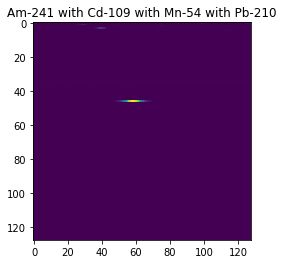

In [46]:
a, b = s[len(s)-1]
plt.imshow(a[0].reshape((128, 128)))
plt.title(" with ".join(binarizer.inverse_transform(np.array([b[0]]))[0]))
plt.show()

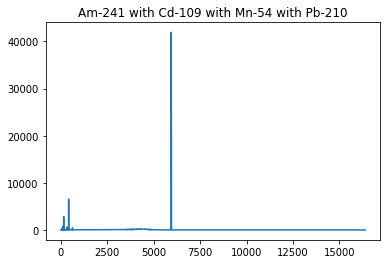

In [47]:
plt.title(" with ".join(binarizer.inverse_transform(np.array([b[0]]))[0]))
plt.plot(a[0].reshape(-1))
plt.show()

In [48]:
learning_rate = 1e-4
epochs = 250
batch_size = 32
steps_per_epoch = len(X) // batch_size + 1
validation_steps = len(X_test) // batch_size + 1

In [49]:
def accuracy_score_wrapper(label, pred):
    threshold = .85
    label = (label >= threshold).astype(np.uint8)
    pred = (pred >= threshold).astype(np.uint8)
    return np.float32(accuracy_score(label, pred))

def my_accuracy_score(label, pred):
    metric_value = tf.py_func(accuracy_score_wrapper, [label, pred], tf.float32)
    return metric_value

In [43]:
K.clear_session()

vgg_model = VGG19(include_top=False,
                  weights=None,
                  input_shape=(128, 128, 1),
                  classes=10)

x = keras.layers.Flatten()(vgg_model.output)
x = keras.layers.Dense(4096, activation='relu')(x)
x = keras.layers.Dense(4096, activation='relu')(x)

x = keras.layers.Dense(10,
                       activation='sigmoid',
                       name="predictions")(x)

model = keras.models.Model(vgg_model.input, x)
model.summary()

Instructions for updating:
Colocations handled automatically by placer.
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 128, 128, 1)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 128, 128, 64)      640       
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 128, 128, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 64, 64, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 64, 64, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 64, 64, 128)       147584    
_________________________________________________________________
bloc

In [44]:
opt = SGD(lr=learning_rate,
          nesterov=True,
          momentum=0.9)

model.compile(optimizer=opt,
              loss='binary_crossentropy',
              metrics=[my_accuracy_score, 'accuracy'])

Instructions for updating:
tf.py_func is deprecated in TF V2. Instead, use
    tf.py_function, which takes a python function which manipulates tf eager
    tensors instead of numpy arrays. It's easy to convert a tf eager tensor to
    an ndarray (just call tensor.numpy()) but having access to eager tensors
    means `tf.py_function`s can use accelerators such as GPUs as well as
    being differentiable using a gradient tape.
    


In [95]:
gerador_treino = EspectraSequence(X, y, batch_size=batch_size)
gerador_validacao = EspectraSequence(X_test, y_test, batch_size=batch_size)

In [96]:
(19 * 250) / 60

79.16666666666667

In [45]:
callbacks = []

hist = model.fit_generator(generator=gerador_treino,
                           steps_per_epoch=steps_per_epoch,
                           epochs=epochs,
                           verbose=2,
                           callbacks=callbacks,
                           validation_data=gerador_validacao,
                           validation_steps=validation_steps,
                           shuffle=True)

Instructions for updating:
Use tf.cast instead.
Epoch 1/250
 - 24s - loss: 0.6134 - my_accuracy_score: 0.0096 - acc: 0.7928 - val_loss: 0.5705 - val_my_accuracy_score: 0.0453 - val_acc: 0.8752
Epoch 2/250
 - 19s - loss: 0.5435 - my_accuracy_score: 0.0203 - acc: 0.8685 - val_loss: 0.5311 - val_my_accuracy_score: 0.0907 - val_acc: 0.8883
Epoch 3/250
 - 19s - loss: 0.5081 - my_accuracy_score: 0.0529 - acc: 0.8898 - val_loss: 0.5035 - val_my_accuracy_score: 0.1147 - val_acc: 0.9152
Epoch 4/250
 - 19s - loss: 0.4868 - my_accuracy_score: 0.0747 - acc: 0.8946 - val_loss: 0.4692 - val_my_accuracy_score: 0.1653 - val_acc: 0.9224
Epoch 5/250
 - 19s - loss: 0.4633 - my_accuracy_score: 0.1036 - acc: 0.8970 - val_loss: 0.4558 - val_my_accuracy_score: 0.1787 - val_acc: 0.9283
Epoch 6/250
 - 19s - loss: 0.4509 - my_accuracy_score: 0.1132 - acc: 0.9051 - val_loss: 0.4371 - val_my_accuracy_score: 0.1787 - val_acc: 0.9325
Epoch 7/250
 - 19s - loss: 0.4699 - my_accuracy_score: 0.1153 - acc: 0.9037 - val_

Epoch 56/250
 - 19s - loss: 0.2748 - my_accuracy_score: 0.2816 - acc: 0.9338 - val_loss: 0.3432 - val_my_accuracy_score: 0.3147 - val_acc: 0.9128
Epoch 57/250
 - 19s - loss: 0.2857 - my_accuracy_score: 0.2864 - acc: 0.9344 - val_loss: 0.2660 - val_my_accuracy_score: 0.3573 - val_acc: 0.9480
Epoch 58/250
 - 19s - loss: 0.2648 - my_accuracy_score: 0.2920 - acc: 0.9380 - val_loss: 0.2484 - val_my_accuracy_score: 0.3867 - val_acc: 0.9512
Epoch 59/250
 - 19s - loss: 0.2697 - my_accuracy_score: 0.2977 - acc: 0.9359 - val_loss: 0.2751 - val_my_accuracy_score: 0.3680 - val_acc: 0.9485
Epoch 60/250
 - 19s - loss: 0.2654 - my_accuracy_score: 0.2986 - acc: 0.9372 - val_loss: 0.2592 - val_my_accuracy_score: 0.4053 - val_acc: 0.9435
Epoch 61/250
 - 19s - loss: 0.2756 - my_accuracy_score: 0.3014 - acc: 0.9387 - val_loss: 0.2450 - val_my_accuracy_score: 0.4027 - val_acc: 0.9571
Epoch 62/250
 - 19s - loss: 0.2856 - my_accuracy_score: 0.2984 - acc: 0.9378 - val_loss: 0.2795 - val_my_accuracy_score: 0.3

 - 19s - loss: 0.1967 - my_accuracy_score: 0.4895 - acc: 0.9676 - val_loss: 0.1796 - val_my_accuracy_score: 0.6133 - val_acc: 0.9715
Epoch 113/250
 - 19s - loss: 0.1908 - my_accuracy_score: 0.5006 - acc: 0.9681 - val_loss: 0.1604 - val_my_accuracy_score: 0.6533 - val_acc: 0.9795
Epoch 114/250
 - 19s - loss: 0.2020 - my_accuracy_score: 0.5139 - acc: 0.9689 - val_loss: 0.1707 - val_my_accuracy_score: 0.6480 - val_acc: 0.9792
Epoch 115/250
 - 19s - loss: 0.1959 - my_accuracy_score: 0.5262 - acc: 0.9696 - val_loss: 0.1475 - val_my_accuracy_score: 0.6720 - val_acc: 0.9803
Epoch 116/250
 - 19s - loss: 0.2146 - my_accuracy_score: 0.5126 - acc: 0.9680 - val_loss: 0.1694 - val_my_accuracy_score: 0.6347 - val_acc: 0.9776
Epoch 117/250
 - 19s - loss: 0.1886 - my_accuracy_score: 0.5276 - acc: 0.9679 - val_loss: 0.2038 - val_my_accuracy_score: 0.6027 - val_acc: 0.9669
Epoch 118/250
 - 19s - loss: 0.1726 - my_accuracy_score: 0.5257 - acc: 0.9696 - val_loss: 0.1621 - val_my_accuracy_score: 0.6267 - v

Epoch 168/250
 - 19s - loss: 0.1031 - my_accuracy_score: 0.6620 - acc: 0.9794 - val_loss: 0.0929 - val_my_accuracy_score: 0.7280 - val_acc: 0.9827
Epoch 169/250
 - 19s - loss: 0.1168 - my_accuracy_score: 0.6543 - acc: 0.9785 - val_loss: 0.1103 - val_my_accuracy_score: 0.7253 - val_acc: 0.9835
Epoch 170/250
 - 19s - loss: 0.1131 - my_accuracy_score: 0.6402 - acc: 0.9790 - val_loss: 0.1408 - val_my_accuracy_score: 0.6853 - val_acc: 0.9733
Epoch 171/250
 - 19s - loss: 0.1443 - my_accuracy_score: 0.6384 - acc: 0.9776 - val_loss: 0.0948 - val_my_accuracy_score: 0.7493 - val_acc: 0.9853
Epoch 172/250
 - 19s - loss: 0.1218 - my_accuracy_score: 0.6604 - acc: 0.9797 - val_loss: 0.1122 - val_my_accuracy_score: 0.7307 - val_acc: 0.9821
Epoch 173/250
 - 19s - loss: 0.1090 - my_accuracy_score: 0.6516 - acc: 0.9787 - val_loss: 0.0797 - val_my_accuracy_score: 0.7360 - val_acc: 0.9856
Epoch 174/250
 - 19s - loss: 0.0922 - my_accuracy_score: 0.6823 - acc: 0.9821 - val_loss: 0.0932 - val_my_accuracy_sco

Epoch 224/250
 - 19s - loss: 0.0085 - my_accuracy_score: 0.9154 - acc: 0.9997 - val_loss: 0.0107 - val_my_accuracy_score: 0.9227 - val_acc: 1.0000
Epoch 225/250
 - 19s - loss: 0.0219 - my_accuracy_score: 0.9100 - acc: 0.9982 - val_loss: 0.0119 - val_my_accuracy_score: 0.9360 - val_acc: 1.0000
Epoch 226/250
 - 19s - loss: 0.0095 - my_accuracy_score: 0.9224 - acc: 0.9995 - val_loss: 0.0103 - val_my_accuracy_score: 0.9467 - val_acc: 1.0000
Epoch 227/250
 - 19s - loss: 0.0083 - my_accuracy_score: 0.9302 - acc: 0.9998 - val_loss: 0.0094 - val_my_accuracy_score: 0.9360 - val_acc: 1.0000
Epoch 228/250
 - 19s - loss: 0.0069 - my_accuracy_score: 0.9352 - acc: 0.9998 - val_loss: 0.0088 - val_my_accuracy_score: 0.9493 - val_acc: 1.0000
Epoch 229/250
 - 19s - loss: 0.0063 - my_accuracy_score: 0.9417 - acc: 0.9999 - val_loss: 0.0083 - val_my_accuracy_score: 0.9520 - val_acc: 1.0000
Epoch 230/250
 - 19s - loss: 0.0059 - my_accuracy_score: 0.9406 - acc: 0.9999 - val_loss: 0.0079 - val_my_accuracy_sco

In [46]:
from keras.models import save_model
save_model(model, 'VGG-19-SGD-sigmoid-PENELOPE.hdf5')

In [97]:
def f_placeholder(a, b):
    return 1.

from keras.models import load_model
model = load_model('VGG-19-SGD-sigmoid-PENELOPE.hdf5',
                  custom_objects={
                      'my_accuracy_score': f_placeholder
                  })

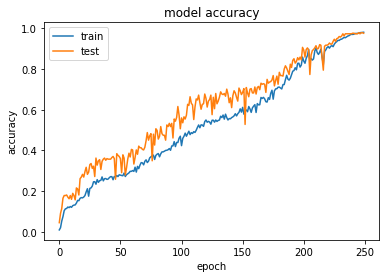

In [47]:
plt.plot(hist.history['my_accuracy_score'])
plt.plot(hist.history['val_my_accuracy_score'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

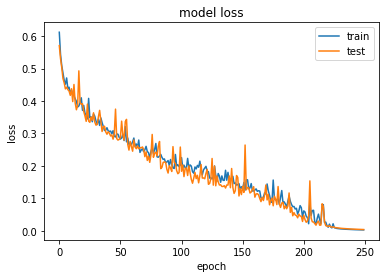

In [48]:
plt.plot(hist.history['loss'])
plt.plot(hist.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper right')
plt.show()

# Validando nos espectros criados com Penelope

10


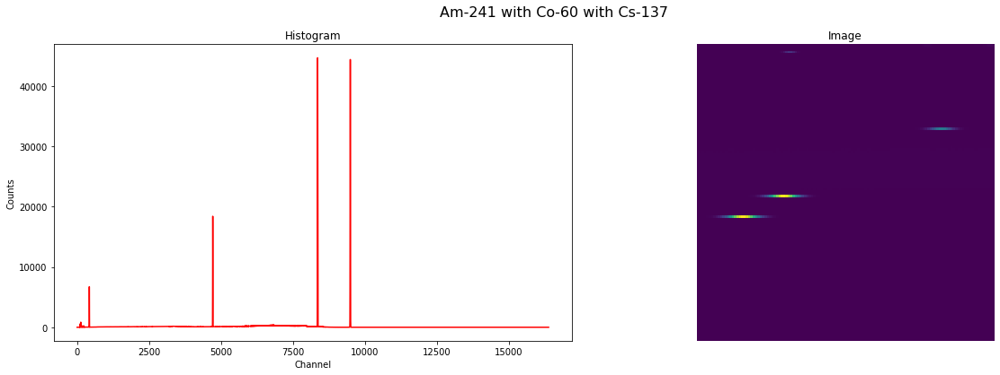

,radionuclideo,score
0,Am-241,100.0000%
1,Ba-133,0.0000%
2,Cd-109,0.0000%
3,Co-57,0.0000%
4,Co-60,100.0000%
5,Cs-137,100.0000%
6,Eu-152,0.0000%
7,Mn-54,0.0000%
8,Na-24,0.0000%
9,Pb-210,0.0000%


In [98]:
rnd_idx = 10#np.random.choice(len(gerador_validacao) - 1, 1)[0]
print(rnd_idx)
x_, y_ = gerador_validacao[rnd_idx]
idx = 0

f, axarr = plt.subplots(nrows=1, ncols=2, figsize=(17, 5.7), constrained_layout=True)

p1 = axarr[0].plot(range(len(x_[idx].reshape(-1))),
              x_[idx].reshape(-1), 'r')

axarr[0].set_xlabel("Channel")
axarr[0].set_ylabel("Counts")

axarr[0].set_title("Histogram")

axarr[1].set_title("Image")
axarr[1].imshow(x_[0].reshape((128,128)))
axarr[1].axis('off')

#f.tight_layout()
f.suptitle(" with ".join(binarizer.inverse_transform(np.array([y_[idx]]))[0]), fontsize=16)
plt.grid(False)
#plt.subplots_adjust(bottom=1.25, top=2.75)
plt.show()

pred = model.predict(np.array([x_[idx].reshape((128, 128, 1))]))
df = pd.DataFrame({'radionuclideo':binarizer.classes_, 'score': pred[0]*100})
df

In [138]:
" with ".join(binarizer.inverse_transform(np.array([y_[idx]]))[0])

IndexError: index 374 is out of bounds for axis 0 with size 1

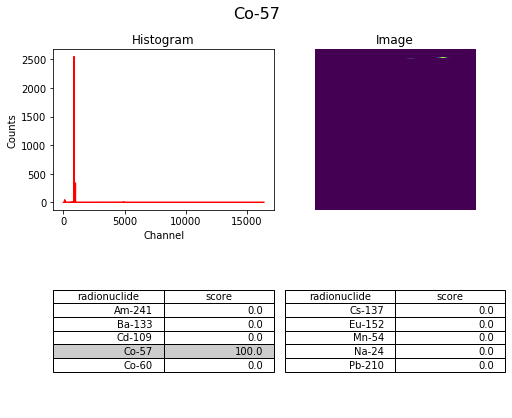

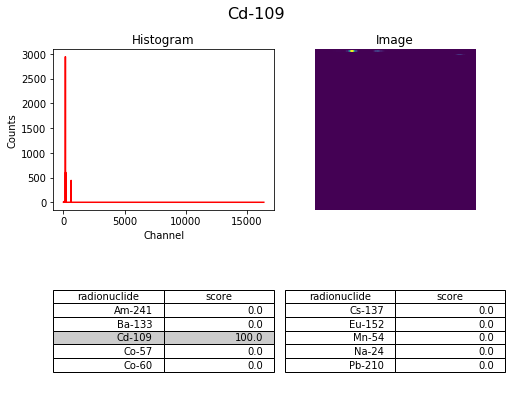

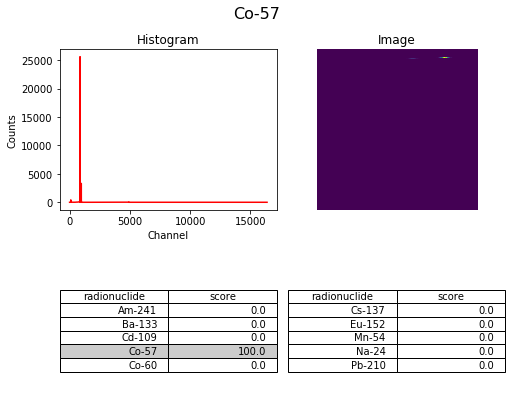

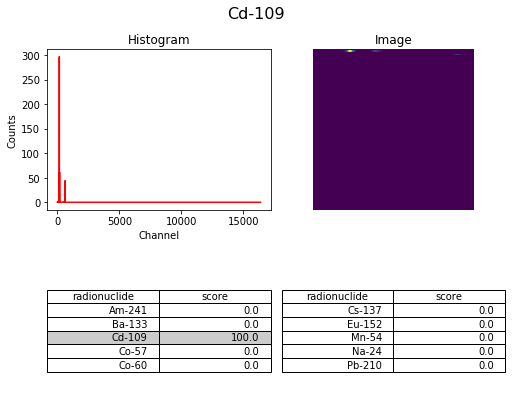

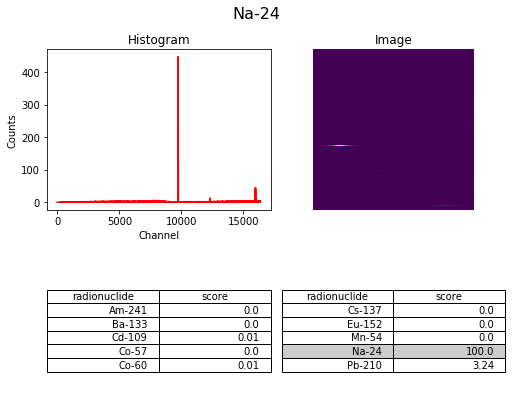

...

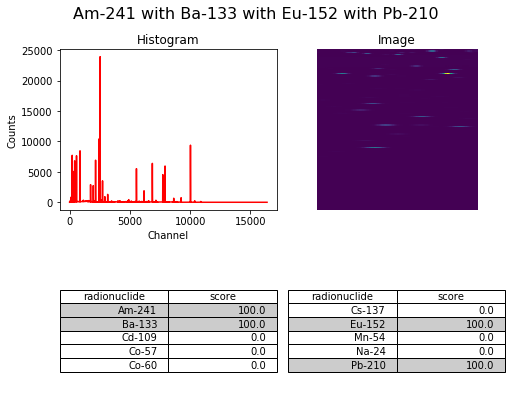

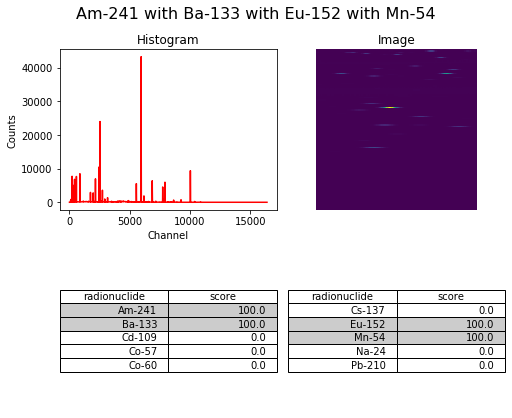

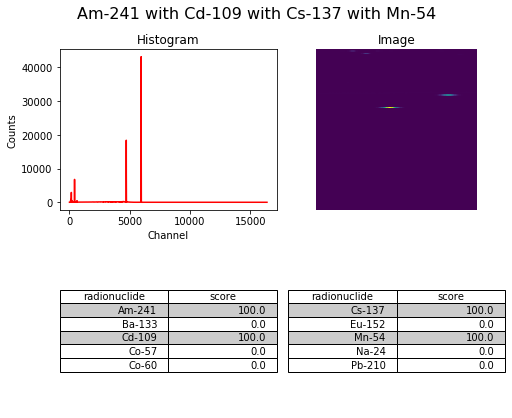

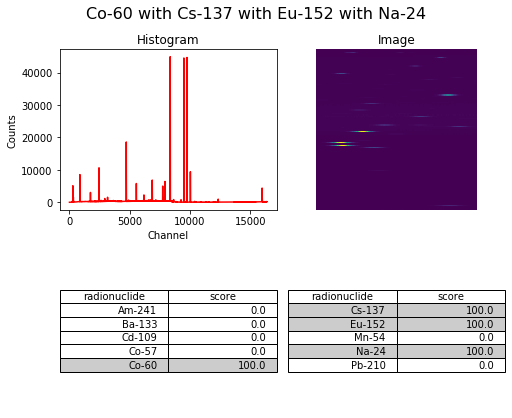

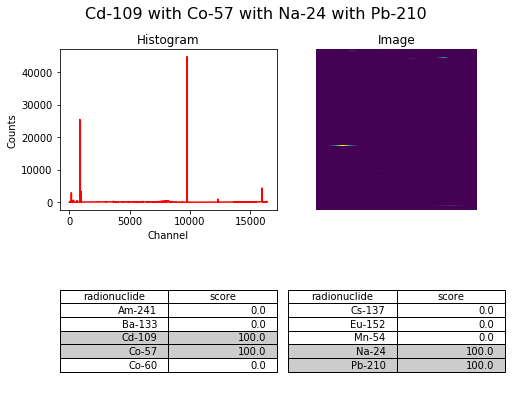

In [135]:
gerador_validacao = EspectraSequence(X_test, y_test, batch_size=1)
#x_, y_ = gerador_validacao[np.random.choice(len(gerador_validacao) - 1, 1)[0]]
idx = 31#np.random.choice(len(gerador_validacao) - 1, 1)[0]
for idx in range(len(y_test)):
    x_, y_ = gerador_validacao[idx]
    
    f, axarr = plt.subplots(2, 2, figsize=(7, 5.7), constrained_layout=True)

    axarr[0][0].plot(range(len(x_[0].reshape(-1))),
                  x_[0].reshape(-1), 'r')

    f.suptitle(" with ".join(binarizer.inverse_transform(np.array([y_[0]]))[0]), fontsize=16)
    axarr[0][0].set_title("Histogram")
    axarr[0][0].set_xlabel("Channel")
    axarr[0][0].set_ylabel("Counts")

    axarr[0][1].set_title("Image")
    axarr[0][1].imshow(x_[0].reshape((128,128)))

    axarr[0][1].axis('off')
    axarr[0][1].grid('off')

    pred = model.predict(np.array([x_[0].reshape((128, 128, 1))]))
    df = pd.DataFrame({'radionuclide':binarizer.classes_,
                       'score': [str(x) for x in np.round(pred[0]*100, 2)]
                      })

    axarr[1][0].axis('off')
    axarr[1][0].axis('tight')

    axarr[1][1].axis('off')
    axarr[1][1].axis('tight')

    tb1 = axarr[1][0].table(cellText=df.values[:5], colLabels=df.columns, loc='center')
    tb2 = axarr[1][1].table(cellText=df.values[5:], colLabels=df.columns, loc='center')

    color1 = "#cccccc"

    for i in range(5):
        if float(df['score'][i]) > 50:
            tb1._cells[(i+1, 0)].set_facecolor(color1)
            tb1._cells[(i+1, 1)].set_facecolor(color1)

    for i in range(5):
        if float(df['score'][i+5]) > 50:
            tb2._cells[(i+1, 0)].set_facecolor(color1)
            tb2._cells[(i+1, 1)].set_facecolor(color1)

    #plt.tight_layout()
    #plt.subplots_adjust(bottom=1.25, top=2.75)
    plt.grid(False)
    plt.show()

In [198]:

import time
from datetime import timedelta
start_time = time.monotonic()

test_data = []

gerador_validacao = EspectraSequence(X_test, y_test, batch_size=1)
#x_, y_ = gerador_validacao[np.random.choice(len(gerador_validacao) - 1, 1)[0]]
idx = 31#np.random.choice(len(gerador_validacao) - 1, 1)[0]

for idx in range(len(y_test)):
    x_, y_ = gerador_validacao[idx]
    


    pred = model.predict(np.array([x_[0].reshape((128, 128, 1))]))
    aux = {"real nuclides" : " with ".join(binarizer.inverse_transform(np.array([y_[0]]))[0])}
    
    for a in list(zip(binarizer.classes_.tolist(), [str(x) for x in np.round(pred[0]*100, 2)])):
        aux[a[0]] = a[1]
    
    test_data.append(aux)
end_time = time.monotonic()
print(timedelta(seconds=end_time - start_time))
print(len(test_data))

0:00:03.957486
375


In [158]:
pd.DataFrame(test_data).sort_values("real nuclides")

,real nuclides,Am-241,Ba-133,Cd-109,Co-57,Co-60,Cs-137,Eu-152,Mn-54,Na-24,Pb-210
83,Am-241,99.98,0.0,1.16,0.0,0.0,0.01,0.0,0.0,0.0,19.75
47,Am-241,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
19,Am-241,99.98,0.0,1.05,0.0,0.0,0.01,0.0,0.0,0.0,20.04
123,Am-241,99.97,0.0,1.59,0.0,0.0,0.01,0.0,0.0,0.0,18.92
89,Am-241,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
103,Am-241,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
56,Am-241,99.98,0.0,1.1,0.0,0.0,0.01,0.0,0.0,0.0,19.88
102,Am-241,99.97,0.0,1.42,0.0,0.0,0.01,0.0,0.0,0.0,19.19
11,Am-241,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
140,Am-241,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [181]:
iloc_idx = [103, 19, 115, 100, 1, 90, 0, 143, 36, 97, 71, 122, 49, 59, 107, 15, 126, 4, 46, 134]
df_aux = pd.DataFrame(test_data).iloc[iloc_idx]#.sort_values("real nuclides")
df_aux
#print(df_aux.to_latex(index=False, longtable=True))

,real nuclides,Am-241,Ba-133,Cd-109,Co-57,Co-60,Cs-137,Eu-152,Mn-54,Na-24,Pb-210
103,Am-241,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
19,Am-241,99.98,0.0,1.05,0.0,0.0,0.01,0.0,0.0,0.0,20.04
115,Ba-133,0.0,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
100,Ba-133,0.0,100.0,0.0,0.0,0.0,0.01,0.0,0.0,0.0,3.03
1,Cd-109,0.0,0.0,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
90,Cd-109,3.62,0.08,99.84,0.12,0.08,0.24,0.93,0.24,0.05,22.46
0,Co-57,0.0,0.0,0.0,100.0,0.0,0.0,0.0,0.0,0.0,0.0
143,Co-57,0.0,0.01,0.06,100.0,0.0,0.0,0.0,0.0,0.0,6.92
36,Co-60,0.0,0.0,0.0,0.0,100.0,0.0,0.0,0.0,0.0,0.0
97,Co-60,0.0,0.0,0.0,0.0,100.0,0.0,0.0,0.0,0.26,2.34


In [193]:
iloc_idx = [334, 242, 297, 205, 209, 201, 337, 161, 344]
df_aux = pd.DataFrame(test_data).iloc[iloc_idx]#.sort_values("real nuclides")
print(df_aux.to_latex(index=False, longtable=True))
len(df_aux), len(y_test) - 150

\begin{longtable}{lllllllllll}
\toprule
                             real nuclides & Am-241 & Ba-133 & Cd-109 &  Co-57 &  Co-60 & Cs-137 & Eu-152 &  Mn-54 &  Na-24 & Pb-210 \\
\midrule
\endhead
\midrule
\multicolumn{11}{r}{{Continued on next page}} \\
\midrule
\endfoot

\bottomrule
\endlastfoot
                        Am-241 with Ba-133 &  100.0 &  100.0 &   0.05 &    0.0 &    0.0 &   0.01 &    0.0 &    0.0 &    0.0 &   3.61 \\
                        Am-241 with Cd-109 &  98.64 &    0.0 &  99.77 &    0.0 &    0.0 &    0.0 &    0.0 &    0.0 &    0.0 &  13.41 \\
 Am-241 with Ba-133 with Cd-109 with Mn-54 &  100.0 &  98.18 &  99.98 &    0.0 &    0.0 &    0.0 &    0.0 &  99.99 &    0.0 &   0.07 \\
  Am-241 with Ba-133 with Co-57 with Mn-54 &  100.0 &  99.99 &    0.0 &  100.0 &    0.0 &    0.0 &    0.0 &  99.99 &    0.0 &   0.19 \\
  Am-241 with Eu-152 with Mn-54 with Na-24 &  100.0 &    0.0 &   0.01 &    0.0 &    0.0 &    0.0 &  100.0 &  100.0 &  99.68 &   0.38 \\
            Am-241 with 

(9, 225)

# Validando nos espectros experimentais

In [77]:
def obtem_dados_dos_canais(linhas):
    dados = []
    pode_comecar = False
    for linha in linhas:
        if linha == "A004USERDEFINED                                                     \n":
            pode_comecar = True
            continue
        if pode_comecar:
            aux = linha.strip().split()
            if int(aux[1]) % 5:
                print("oi!")
            dados.extend([float(x) for x in aux[2:]])
    return dados[1:]

In [78]:
arquivos = ['Am-241 - BG.IEC',
            'Ba-133 - BG.IEC',
            'Cd-109 - BG.IEC',
            'Co-57 - BG.IEC',
            'Co-60 - BG.IEC',
            'Cs-137 - BG.IEC',
            'Eu-152 - BG.IEC',
            'Mn-54 - BG.IEC',
            'Na-22 - BG.IEC',
            'Pb-210 - BG.IEC',]

df_nuclideos = dict()
img_espectros = dict()
img_convertidos = dict()
images = dict()

for arquivo in arquivos:
    print(arquivo)
    dados = []

    with open('/export/ipen/artigo/ICDA-3/Espectros/Experimentos/17-Maio-2018/Espectros/{0}'.format(arquivo), 'r') as f:
        dados = f.readlines()
    dados = obtem_dados_dos_canais(dados)
    df = pd.DataFrame({'channel': range(0, len(dados)), 'counts' : dados})
    df_nuclideos[arquivo] = df.copy()
    img_convertidos[arquivo] = np.array(dados).reshape((128, 128)).copy()
    images[arquivo.split(' ')[0]] = np.array(dados).reshape((128, 128)).copy()

Am-241 - BG.IEC
Ba-133 - BG.IEC
Cd-109 - BG.IEC
Co-57 - BG.IEC
Co-60 - BG.IEC
Cs-137 - BG.IEC
Eu-152 - BG.IEC
Mn-54 - BG.IEC
Na-22 - BG.IEC
Pb-210 - BG.IEC


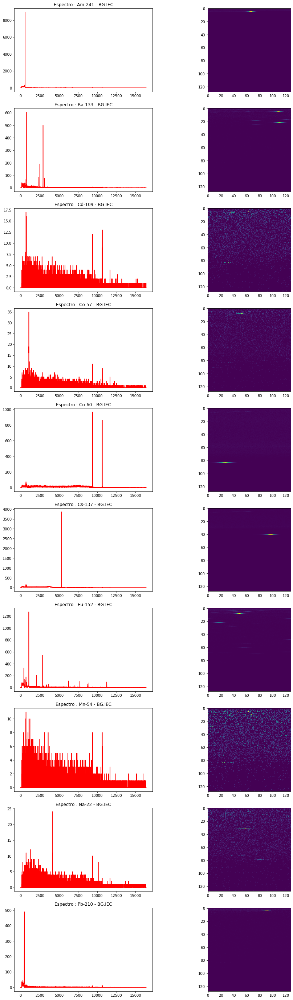

In [55]:
f, axarr = plt.subplots(10, 2, figsize=(15,25))
for n, arquivo in enumerate(arquivos):
    df = df_nuclideos[arquivo]
    axarr[n, 0].plot(df['channel'], df['counts'], 'r')
    axarr[n, 0].set_title("Espectro : {0}".format(arquivo))
    
    axarr[n, 1].imshow(img_convertidos[arquivo])
    #axarr[n, 1].set_title("Como Imagem : {0}".format(arquivo))
    
plt.grid(False)
plt.subplots_adjust(bottom=1.25, top=2.75)
plt.show()

In [56]:
np.argmax(carrega_dados('../dados/Am-241_46cm_1-0e09estories_10-0.dat', 1e9)['counts'].values)

/home/andre/.conda/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


424

In [159]:
578 - 424

154

In [57]:
from scipy.ndimage.interpolation import shift

pred = model.predict(np.array([shift(images['Am-241'].reshape(-1), -154, cval=0).reshape((128, 128, 1))]))
df = pd.DataFrame({'radionuclideo':binarizer.classes_, 'score': pred[0]*100})
df

,radionuclideo,score
0,Am-241,100.0000%
1,Ba-133,0.0000%
2,Cd-109,0.0000%
3,Co-57,0.0000%
4,Co-60,0.0000%
5,Cs-137,0.0000%
6,Eu-152,0.0000%
7,Mn-54,0.0000%
8,Na-24,0.0000%
9,Pb-210,100.0000%


In [58]:
#pred = model.predict(np.array([np.roll(images['Ba-133'], 401).reshape((128, 128, 1))]))
pred = model.predict(np.array([shift(images['Ba-133'].reshape(-1), -154, cval=0).reshape((128, 128, 1))]))
df = pd.DataFrame({'radionuclideo':binarizer.classes_, 'score': pred[0]*100})
df

,radionuclideo,score
0,Am-241,0.0000%
1,Ba-133,0.0000%
2,Cd-109,0.0000%
3,Co-57,99.9961%
4,Co-60,0.0000%
5,Cs-137,0.0000%
6,Eu-152,0.0000%
7,Mn-54,0.0000%
8,Na-24,0.0000%
9,Pb-210,100.0000%


In [59]:
#pred = model.predict(np.array([images['Cd-109'].reshape((128, 128, 1))]))
pred = model.predict(np.array([shift(images['Cd-109'].reshape(-1), -154, cval=0).reshape((128, 128, 1))]))
df = pd.DataFrame({'radionuclideo':binarizer.classes_, 'score': pred[0]*100})
df

,radionuclideo,score
0,Am-241,81.3958%
1,Ba-133,0.3223%
2,Cd-109,67.8884%
3,Co-57,13.9759%
4,Co-60,0.0021%
5,Cs-137,0.0989%
6,Eu-152,95.0243%
7,Mn-54,0.0240%
8,Na-24,0.0041%
9,Pb-210,99.2299%


In [163]:
#pred = model.predict(np.array([images['Co-57'].reshape((128, 128, 1))]))
pred = model.predict(np.array([shift(images['Co-57'].reshape(-1), -154, cval=0).reshape((128, 128, 1))]))
df = pd.DataFrame({'radionuclideo':binarizer.classes_, 'score': pred[0]*100})
df

,radionuclideo,score
0,Am-241,18.2238%
1,Ba-133,0.0138%
2,Cd-109,98.4820%
3,Co-57,9.1592%
4,Co-60,0.0013%
5,Cs-137,0.0725%
6,Eu-152,54.9116%
7,Mn-54,0.0036%
8,Na-24,0.0031%
9,Pb-210,84.8971%


In [169]:
#pred = model.predict(np.array([images['Co-60'].reshape((128, 128, 1))]))
pred = model.predict(np.array([shift(images['Co-60'].reshape(-1), -155, cval=0).reshape((128, 128, 1))]))
df = pd.DataFrame({'radionuclideo':binarizer.classes_, 'score': pred[0]*100})
df

,radionuclideo,score
0,Am-241,93.6579%
1,Ba-133,0.0000%
2,Cd-109,100.0000%
3,Co-57,0.0000%
4,Co-60,0.0000%
5,Cs-137,0.0000%
6,Eu-152,99.9979%
7,Mn-54,0.0000%
8,Na-24,0.0000%
9,Pb-210,100.0000%


In [170]:
#pred = model.predict(np.array([images['Cs-137'].reshape((128, 128, 1))]))
pred = model.predict(np.array([shift(images['Cs-137'].reshape(-1), -155, cval=0).reshape((128, 128, 1))]))
df = pd.DataFrame({'radionuclideo':binarizer.classes_, 'score': pred[0]*100})
df

,radionuclideo,score
0,Am-241,100.0000%
1,Ba-133,0.0000%
2,Cd-109,100.0000%
3,Co-57,0.0000%
4,Co-60,0.0000%
5,Cs-137,0.0000%
6,Eu-152,0.0000%
7,Mn-54,99.5243%
8,Na-24,0.0000%
9,Pb-210,100.0000%


In [171]:
#pred = model.predict(np.array([images['Eu-152'].reshape((128, 128, 1))]))
pred = model.predict(np.array([shift(images['Eu-152'].reshape(-1), -155, cval=0).reshape((128, 128, 1))]))
df = pd.DataFrame({'radionuclideo':binarizer.classes_, 'score': pred[0]*100})
df

,radionuclideo,score
0,Am-241,0.0000%
1,Ba-133,0.0000%
2,Cd-109,100.0000%
3,Co-57,0.0000%
4,Co-60,0.0000%
5,Cs-137,0.0000%
6,Eu-152,0.0000%
7,Mn-54,0.0000%
8,Na-24,0.0000%
9,Pb-210,100.0000%


In [ ]:
pred = model.predict(np.array([images['Mn-54'].reshape((128, 128, 1))]))
df = pd.DataFrame({'radionuclideo':binarizer.classes_, 'score': pred[0]*100})
df

In [ ]:
pred = model.predict(np.array([images['Na-22'].reshape((128, 128, 1))]))
df = pd.DataFrame({'radionuclideo':binarizer.classes_, 'score': pred[0]*100})
df

In [ ]:
pred = model.predict(np.array([images['Pb-210'].reshape((128, 128, 1))]))
df = pd.DataFrame({'radionuclideo':binarizer.classes_, 'score': pred[0]*100})
df

## Fonte triplice de calibração

In [79]:
dados = []

with open('/export/ipen/artigo/ICDA-3/Espectros/Experimentos/17-Maio-2018/Espectros/Am-Cs-Co - BG.IEC', 'r') as f:
    dados = f.readlines()
dados = obtem_dados_dos_canais(dados)
df_triplice = pd.DataFrame({'channel': range(0, len(dados)), 'counts' : dados})

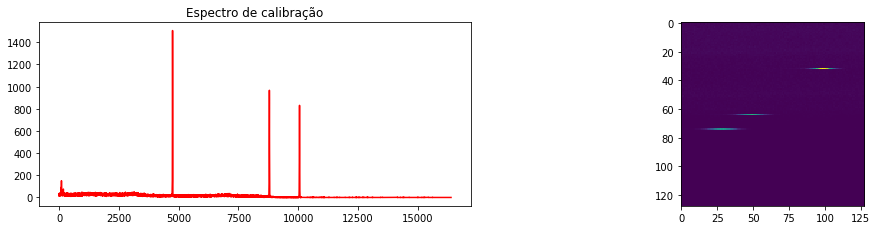

In [107]:
f, axarr = plt.subplots(1, 2, figsize=(17, 1.7))
axarr[0].plot(df_triplice['channel'], df_triplice.counts.shift(-600).fillna(0).values, 'r')
axarr[0].set_title("Espectro de calibração")
axarr[1].imshow(np.array(dados).reshape((128,128)))

plt.grid(False)
plt.subplots_adjust(bottom=1.25, top=2.75)
plt.show()

In [111]:
dados = df_triplice.counts.shift(-550).fillna(0).values
pred = model.predict(np.array([dados.reshape((128, 128, 1))]))
df = pd.DataFrame({'radionuclideo':binarizer.classes_, 'score': pred[0]*100})
df.T

,0,1,2,3,4,5,6,7,8,9
radionuclideo,Am-241,Ba-133,Cd-109,Co-57,Co-60,Cs-137,Eu-152,Mn-54,Na-24,Pb-210
score,0.0000%,0.0000%,100.0000%,0.0000%,0.0000%,0.0000%,0.0000%,0.0000%,0.0000%,0.0000%
